In [1]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'matplotlib.backends.registry'

In [3]:
B= np.arange(670, 921, 1)
X=1
C=np.array([])
cumsum=0
for i in range(670,921):
    if i%5==1:
        cumsum=cumsum+5
    C=np.append(C,cumsum)
P1=(920-B)*C*X

16125.0 121 791


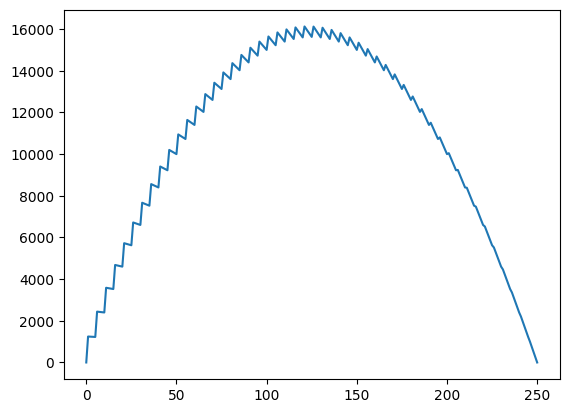

In [3]:
plt.plot(P1)
m=max(P1)
idx=np.argmax(P1)
print(m,idx,B[idx])

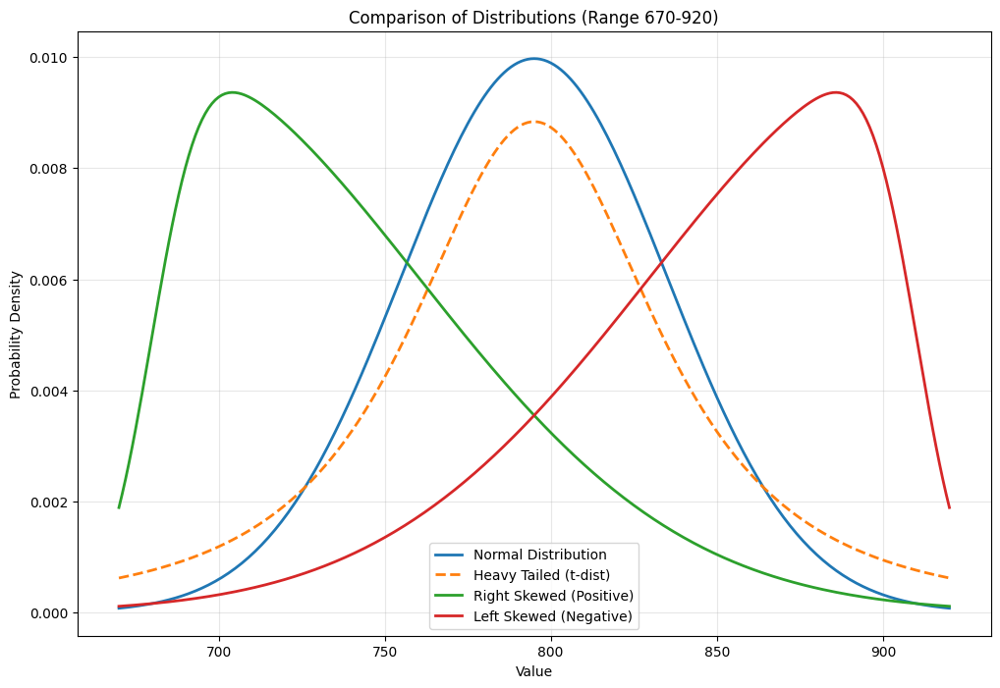

In [4]:
from scipy.stats import norm, skewnorm, t

# 1. Setup the range
x = np.arange(670, 921)
mid = (670 + 920) / 2
std = 40  # Standard deviation to keep most data within the range

# 2. Define the Distributions
# Normal Distribution
B1 = norm.pdf(x, loc=mid, scale=std)

# Heavy Tailed (Student's t-distribution with low degrees of freedom)
# df=2 creates much "fatter" tails than a normal distribution
B2 = t.pdf(x, df=2, loc=mid, scale=std)

# Right Skewed (Positive skew)
# a > 0 pushes the mass to the left, tail to the right
B3 = skewnorm.pdf(x, a=7, loc=680, scale=80)

# Left Skewed (Negative skew)
# a < 0 pushes the mass to the right, tail to the left
B4= skewnorm.pdf(x, a=-7, loc=910, scale=80)

# 3. Plotting
plt.figure(figsize=(12, 8))

plt.plot(x, B1, label='Normal Distribution', lw=2)
plt.plot(x, B2, label='Heavy Tailed (t-dist)', lw=2, linestyle='--')
plt.plot(x, B3, label='Right Skewed (Positive)', lw=2)
plt.plot(x, B4, label='Left Skewed (Negative)', lw=2)

plt.title("Comparison of Distributions (Range 670-920)")
plt.xlabel("Value")
plt.ylabel("Probability Density")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

In [5]:
B22=np.arange(670,921,1)
#Bglobalavg = np.sum(x * (B1 / np.sum(B1)))
#Bglobalavg = np.sum(x * (B2 / np.sum(B2)))
#Bglobalavg = np.sum(x * (B3 / np.sum(B3)))
#Bglobalavg  = np.sum(x * (B4 / np.sum(B4)))
Bglobalavg=810
profit = np.zeros((len(B), len(B22)))

for i in range(len(B)):
    pool=cumsum-C[i]+5
    for j in range(len(B22)):
        if(B22[j]>Bglobalavg):
            profit[i][j]=P1[i]+pool*(920-B22[j])*X
        else:
            numerator = 920 - Bglobalavg
            denominator = 920 - B22[j]
            if denominator !=0:
                penalty = (numerator / denominator) ** 3
            else:
                penalty=1
            profit[i][j]=P1[i]+pool*(920-B22[j])*X*penalty


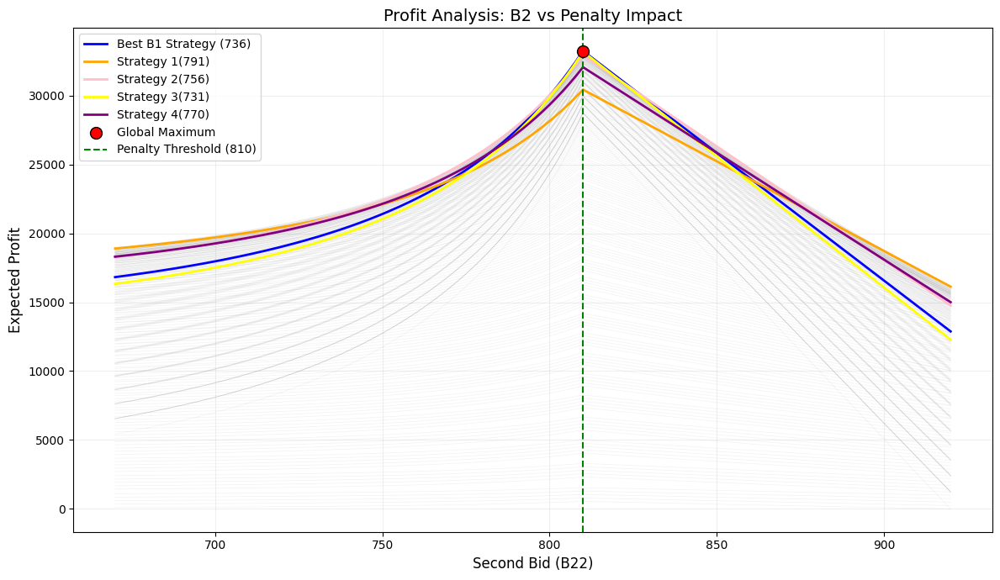

In [6]:

# ... (Previous logic for 'profit' matrix remains the same) ...

plt.figure(figsize=(12, 7))

# 1. Plot the lines WITHOUT individual labels to avoid the legend explosion
# We use 'alpha' to make them slightly transparent so we can see the density
plt.plot(B22, profit.T, color='gray', alpha=0.1, lw=0.5)

# 2. Find the GLOBAL maximum to highlight it
max_idx = np.unravel_index(np.argmax(profit, axis=None), profit.shape)
best_b1_val = B[max_idx[0]]
best_b2_val = B22[max_idx[1]]
global_max_profit = profit[max_idx]

# 3. Highlight just the BEST strategy line
plt.plot(B22, profit[max_idx[0], :], color='blue', lw=2, label=f'Best B1 Strategy ({best_b1_val})')
plt.plot(B22,profit[121,:],color='orange',lw=2,label=f"Strategy 1({B[121]})")
plt.plot(B22,profit[86,:],color='pink',lw=2,label=f"Strategy 2({B[86]})")
plt.plot(B22,profit[61,:],color='yellow',lw=2,label=f"Strategy 3({B[61]})")
plt.plot(B22,profit[100,:],color='purple',lw=2,label=f"Strategy 4({B[100]})")
# 4. Add a single marker for the absolute peak
plt.scatter(best_b2_val, global_max_profit, color='red', s=100, edgecolors='black', zorder=5, label='Global Maximum')

# 5. Visual clean up
plt.axvline(Bglobalavg, color='green', linestyle='--', label=f'Penalty Threshold ({Bglobalavg})')
plt.title("Profit Analysis: B2 vs Penalty Impact", fontsize=14)
plt.xlabel("Second Bid (B22)", fontsize=12)
plt.ylabel("Expected Profit", fontsize=12)

# This is the most important fix: 
# We only show the specific labels we defined above
plt.legend(loc='upper left') 

plt.grid(True, alpha=0.2)
plt.tight_layout()
plt.show()

In [7]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [8]:
print(type(cumsum)) # Should say <class 'numpy.ndarray'>
print(type(C))      # Should say <class 'numpy.ndarray'>

<class 'int'>
<class 'numpy.ndarray'>


Pre-computing frames...
Done.
Saving GIF (may take ~30s)...
Done.



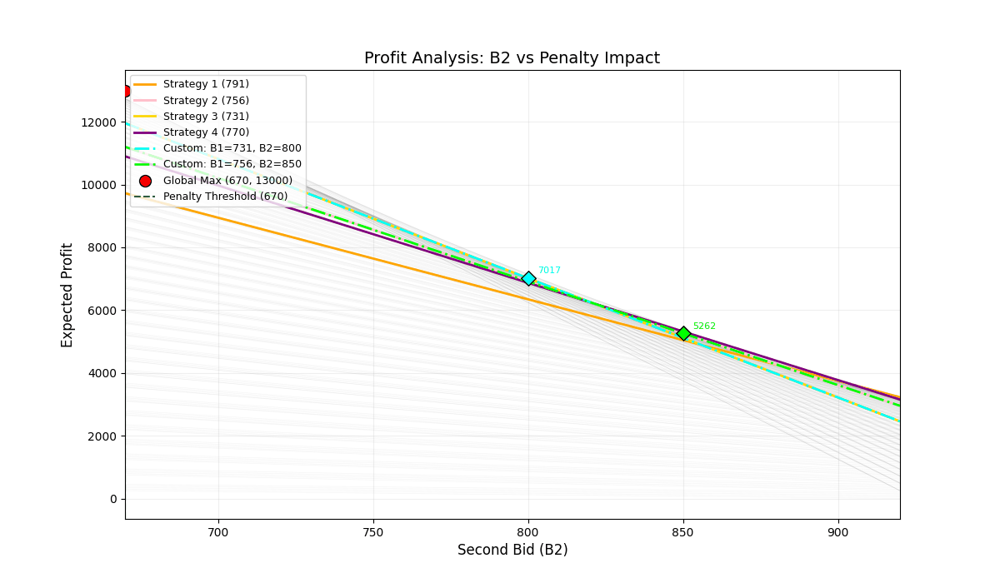

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# --- Setup (fixed quantities) ---
B   = np.arange(670, 921, 1)
B22 = np.arange(670, 921, 1)
X   = 1

C      = np.zeros(len(B))
cumsum = 0
for idx, i in enumerate(range(670, 921)):
    if i % 5 == 0:
        cumsum += 1
    C[idx] = cumsum
total_pool = C[-1]

P1 = (920 - B) * C * X

idx121 = 121
idx86  =  86
idx61  =  61
idx100 = 100

avg_values = np.arange(670, 921, 5)

def compute_profit(Bglobalavg):
    profit = np.zeros((len(B), len(B22)))
    for i in range(len(B)):
        pool = total_pool - C[i] + (1 if B[i] % 5 == 0 else 0)
        for j in range(len(B22)):
            base = P1[i] + pool * (920 - B22[j]) * X
            if B22[j] >= Bglobalavg:
                profit[i, j] = base
            else:
                denom = 920 - B22[j]
                if denom != 0:
                    penalty = ((920 - Bglobalavg) / denom) ** 3
                else:
                    penalty = 1
                profit[i, j] = P1[i] + pool * (920 - B22[j]) * X * penalty
    return profit

print("Pre-computing frames...")
frames = []
for avg in avg_values:
    frames.append(compute_profit(avg))
print("Done.")

# ✅ FIX 1: Define custom_strategies and custom_indices OUTSIDE draw_frame
custom_strategies = [
    (731, 800, 'cyan', 'Custom: B1=731, B2=800'),
    (756, 850, 'lime', 'Custom: B1=756, B2=850'),
]
custom_indices = [(np.where(B == b1)[0][0], b2, color, label)
                  for b1, b2, color, label in custom_strategies]

fig, ax = plt.subplots(figsize=(12, 7))

def draw_frame(frame_idx):
    ax.clear()
    Bglobalavg = avg_values[frame_idx]
    profit     = frames[frame_idx]

    ax.plot(B22, profit.T, color='gray', alpha=0.08, lw=0.5)

    max_idx        = np.unravel_index(np.argmax(profit), profit.shape)
    best_b1_val    = B[max_idx[0]]
    best_b2_val    = B22[max_idx[1]]
    global_max_pnl = profit[max_idx]

    ax.plot(B22, profit[idx121, :], color='orange', lw=2, label=f'Strategy 1 ({B[idx121]})')
    ax.plot(B22, profit[idx86,  :], color='pink',   lw=2, label=f'Strategy 2 ({B[idx86]})')
    ax.plot(B22, profit[idx61,  :], color='gold',   lw=2, label=f'Strategy 3 ({B[idx61]})')
    ax.plot(B22, profit[idx100, :], color='purple', lw=2, label=f'Strategy 4 ({B[idx100]})')

    # ✅ FIX 2: custom_indices now accessible here (defined in outer scope)
    for b1_idx, b2_val, color, label in custom_indices:
        ax.plot(B22, profit[b1_idx, :], color=color, lw=2, linestyle='-.', label=label)
        b2_idx    = np.where(B22 == b2_val)[0][0]
        pnl_at_b2 = profit[b1_idx, b2_idx]
        ax.scatter(b2_val, pnl_at_b2, color=color, s=80,
                   edgecolors='black', zorder=6, marker='D')
        ax.annotate(f'{pnl_at_b2:.0f}', xy=(b2_val, pnl_at_b2),
                    xytext=(8, 4), textcoords='offset points', fontsize=8, color=color)

    ax.scatter(best_b2_val, global_max_pnl, color='red', s=100,
               edgecolors='black', zorder=5, label=f'Global Max ({best_b2_val}, {global_max_pnl:.0f})')
    ax.axvline(Bglobalavg, color='green', linestyle='--',
               label=f'Penalty Threshold ({Bglobalavg})')

    ax.set_title("Profit Analysis: B2 vs Penalty Impact", fontsize=14)
    ax.set_xlabel("Second Bid (B2)", fontsize=12)
    ax.set_ylabel("Expected Profit", fontsize=12)
    ax.set_xlim(670, 920)
    ax.legend(loc='upper left', fontsize=9)
    ax.grid(True, alpha=0.2)

ani = animation.FuncAnimation(fig, draw_frame, frames=len(avg_values),
                               interval=200, repeat=True)

from IPython.display import HTML, display
import tempfile, base64, os

with tempfile.NamedTemporaryFile(suffix='.gif', delete=False) as tmp:
    tmp_path = tmp.name

print("Saving GIF (may take ~30s)...")
ani.save(tmp_path, writer='pillow', fps=5, dpi=100)
plt.close()
print("Done.")

with open(tmp_path, 'rb') as f:
    b64 = base64.b64encode(f.read()).decode()
os.unlink(tmp_path)

display(HTML(f'<img src="data:image/gif;base64,{b64}" style="width:100%;" />'))

In [ ]:
# %pip install ipympl

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


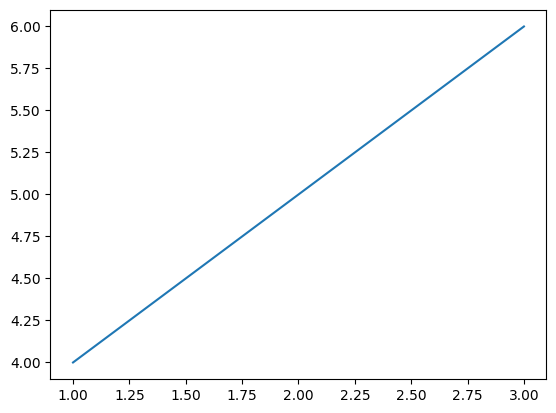

In [12]:
# import sys
# # Install/Update if missing
# !{sys.executable} -m pip install -U ipympl matplotlib ipywidgets

# # USE THIS MAGIC INSTEAD
# %matplotlib ipympl 

import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, IntSlider

# Test if it works
plt.figure()
plt.plot([1, 2, 3], [4, 5, 6])
plt.show()

In [ ]:
# %pip install plotly

Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: plotly in c:\users\amans\appdata\local\programs\python\python312\lib\site-packages (5.18.0)




[notice] A new release of pip is available: 24.3.1 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
import numpy as np
import plotly.graph_objects as go

# --- 1. Data Setup ---
B = np.arange(670, 921, 1)
B22 = np.arange(670, 921, 1)
X = 1

C = np.zeros(len(B))
cumsum = 0
for idx, val in enumerate(range(670, 921)):
    if val % 5 == 0: cumsum += 1
    C[idx] = cumsum
total_pool = C[-1]
P1 = (920 - B) * C * X
pool_arr = total_pool - C + 5

# Indices to track
idx_list = [121, 86, 61, 100, 71, 96]  # Corresponding to B1 values: 791, 756, 731, 770, 741, 766
strategy_names = [f"Strategy B1={B[i]}" for i in idx_list]
colors = ['red', 'pink', 'gold', 'purple', 'cyan', 'lime']


# --- 2. Create the Figure ---
fig = go.Figure()

# Define the threshold range for the slider
avg_values = np.arange(670, 925, 5)

# 3. Add Traces (One set of lines for each possible slider position)
for avg in avg_values:
    # Calculate profit for the 4 main strategies at this Bglobalavg
    for i, idx in enumerate(idx_list):
        p = pool_arr[idx]
        base = P1[idx] + p * (920 - B22) * X
        penalty = ((920 - avg) / (920 - B22 + 1e-9)) ** 3
        y_values = np.where(B22 >= avg, base, P1[idx] + p * (920 - B22) * X * penalty)
        
        # We only make the first set of lines visible initially
        fig.add_trace(
            go.Scatter(
                x=B22, y=y_values,
                name=strategy_names[i],
                line=dict(color=colors[i], width=2),
                visible=(avg == avg_values[0])
            )
        )
    
    # Add the vertical threshold line for this step
    fig.add_shape(
        type="line", x0=avg, x1=avg, y0=0, y1=max(P1)*2,
        line=dict(color="Green", width=2, dash="dash"),
        visible=(avg == avg_values[0]),
        name="Threshold"
    )

# --- 4. Define Slider Steps ---
steps = []
num_strategies = len(idx_list)
for i, avg in enumerate(avg_values):
    # Determine which traces to turn on
    # We turn on the i-th set of strategy lines
    step = dict(
        method="update",
        label=str(avg),
        args=[{"visible": [False] * len(fig.data)},
              {"shapes": [{"type": "line", "x0": avg, "x1": avg, "y0": 0, "y1": max(P1)*2, 
                           "line": dict(color="Green", width=2, dash="dash")}]}]
    )
    # Set visibility for the specific strategies in this frame
    for j in range(num_strategies):
        step["args"][0]["visible"][i * num_strategies + j] = True
    steps.append(step)

# --- 5. Final Layout ---
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Bglobalavg: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders,
    title="Interactive Profit Analysis (Plotly Edition)",
    xaxis_title="Second Bid (B2)",
    yaxis_title="Expected Profit",
    yaxis=dict(range=[0, 12000]),
    template="plotly_dark",
    legend=dict(x=0.99, y=0.99),
    
)

fig.show()